## Installation of packages

We install mirdata to manage the datasets and audiomentations for audio transformations such as adding noise, time stretching, pitch shifting.

In [1]:
!pip install mirdata
!pip install audiomentations

     |████████████████████████████████| 13.1 MB 5.4 MB/s 
     |████████████████████████████████| 51 kB 41 kB/s 
     |████████████████████████████████| 5.6 MB 15.3 MB/s 
     |████████████████████████████████| 51 kB 7.1 MB/s 
     |████████████████████████████████| 90 kB 8.7 MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-py3-none-any.whl size=5591955 sha256=6a6a0b7907822d178d5318045c80d2ba03b38d7f0f24096a7a6fb9926e1d125f
  Stored in directory: /root/.cache/pip/wheels/ad/74/7c/a06473ca8dcb63efb98c1e67667ce39d52100f837835ea18fa
  Created wheel for jams: filename=jams-0.3.4-py3-none-any.whl size=64922 sha256=7cd6ec0a838eec49c1a575f6a3e42f6bc6ab538d301ef01897efdbed52a32a05
  Stored in directory: /root/.cache/pip/wheels/c9/aa/16/ce72bc4caa58dfab819e3f46b3542f2bf90a83009f4ea07a48
  Created wheel for mir-eval: filename=mir_eval-0.7-py3-none-any.whl size=100721 sha256=63a530b68eebade234fb46790d80f9ad7c4c4f442ce6cee11b8d086f2bd7be92
  Stored in directory: /root/.cache/pip/wh

We download the audfprint repository which has an audio fingerprint API which can construct a database from a directory and query the database. 

In [2]:
!git clone https://github.com/dpwe/audfprint.git
%cd audfprint/
!pip install -r requirements.txt

Cloning into 'audfprint'...
remote: Enumerating objects: 656, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 656 (delta 0), reused 1 (delta 0), pack-reused 653
Receiving objects: 100% (656/656), 2.25 MiB | 20.58 MiB/s, done.
Resolving deltas: 100% (423/423), done.
/content/audfprint


## Data preparation

We import the libraries and we initialize and download the Orchset dataset with mirdata. 

In [3]:
import os
import mirdata
import soundfile as sf
import audiomentations
dataset = mirdata.initialize("orchset")

In [4]:
dataset.download()

INFO: Downloading ['all'] to /root/mir_datasets/orchset
INFO: [all] downloading Orchset_dataset_0.zip
311MB [00:33, 9.75MB/s]                           


In [5]:
import IPython.display as ipd
tracks = dataset.load_tracks()  
track = tracks['Beethoven-S5-I-ex1']
x, sr = track.audio_mono
ipd.Audio(x,rate=sr)

## Fingerprinting

This is the path where the mono audio files are located. 

In [6]:
os.path.join(dataset.data_home,'audio','mono')

'/root/mir_datasets/orchset/audio/mono'

Using the path above we can construct a new database by ingesting all the files in the corresponding path. 

In [7]:
!python audfprint.py new --dbase fpdbase.pklz /root/mir_datasets/orchset/audio/mono/*.wav

Tue Mar  1 10:52:56 2022 ingesting #0: /root/mir_datasets/orchset/audio/mono/Beethoven-S3-I-ex1.wav ...
Tue Mar  1 10:52:56 2022 ingesting #1: /root/mir_datasets/orchset/audio/mono/Beethoven-S3-I-ex2.wav ...
Tue Mar  1 10:52:56 2022 ingesting #2: /root/mir_datasets/orchset/audio/mono/Beethoven-S3-I-ex3.wav ...
Tue Mar  1 10:52:57 2022 ingesting #3: /root/mir_datasets/orchset/audio/mono/Beethoven-S3-I-ex5.wav ...
Tue Mar  1 10:52:57 2022 ingesting #4: /root/mir_datasets/orchset/audio/mono/Beethoven-S3-I-ex6.wav ...
Tue Mar  1 10:52:57 2022 ingesting #5: /root/mir_datasets/orchset/audio/mono/Beethoven-S5-I-ex1.wav ...
Tue Mar  1 10:52:57 2022 ingesting #6: /root/mir_datasets/orchset/audio/mono/Beethoven-S5-II-ex1.wav ...
Tue Mar  1 10:52:58 2022 ingesting #7: /root/mir_datasets/orchset/audio/mono/Beethoven-S5-II-ex2.wav ...
Tue Mar  1 10:52:58 2022 ingesting #8: /root/mir_datasets/orchset/audio/mono/Beethoven-S5-II-ex3.wav ...
Tue Mar  1 10:52:58 2022 ingesting #9: /root/mir_datasets/orc

We test the system with the stereo audio for one track in the database. The system should be robust to taking one of the channels as input. 

In [8]:
!mkdir '/root/temp'
x, sr = track.audio_stereo
out_filename = os.path.join('/root/temp',track.track_id+'-L.wav')
print(out_filename)
sf.write(out_filename, x[0,int(5*sr):], sr)
out_filename = os.path.join('/root/temp',track.track_id+'-R.wav')
print(out_filename)
sf.write(out_filename, x[1,int(5*sr):], sr)

/root/temp/Beethoven-S5-I-ex1-L.wav
/root/temp/Beethoven-S5-I-ex1-R.wav


In [9]:
!python audfprint.py match --dbase fpdbase.pklz /root/temp/Beethoven-S5-I-ex1-L.wav 
%matplotlib
!python audfprint.py match --dbase fpdbase.pklz /root/temp/Beethoven-S5-I-ex1-R.wav -I

Tue Mar  1 10:53:15 2022 Reading hash table fpdbase.pklz
Read fprints for 64 files ( 23940 hashes) from fpdbase.pklz (0.00% dropped)
Tue Mar  1 10:53:17 2022 Analyzed #0 /root/temp/Beethoven-S5-I-ex1-L.wav of 17.856 s to 658 hashes
Matched /root/temp/Beethoven-S5-I-ex1-L.wav 17.9 sec 658 raw hashes as /root/mir_datasets/orchset/audio/mono/Beethoven-S5-I-ex1.wav at    5.0 s with    61 of    61 common hashes at rank  0
Processed 1 files (18.1 s total dur) in 2.4 s sec = 0.132 x RT
Using matplotlib backend: agg
Tue Mar  1 10:53:19 2022 Reading hash table fpdbase.pklz
Read fprints for 64 files ( 23940 hashes) from fpdbase.pklz (0.00% dropped)
Tue Mar  1 10:53:22 2022 Analyzed #0 /root/temp/Beethoven-S5-I-ex1-R.wav of 17.740 s to 856 hashes
<Figure size 640x480 with 1 Axes>
Matched /root/temp/Beethoven-S5-I-ex1-R.wav 17.7 sec 856 raw hashes as /root/mir_datasets/orchset/audio/mono/Beethoven-S5-I-ex1.wav at    5.0 s with    43 of    46 common hashes at rank  0
Processed 2 files (36.3 s total

The two queries contains audio from Beethoven-S5-I-ex1.wav starting at 5 sec into the track, left and right channel separately. There were a total of 61/43 landmark hashes shared between the query and that track. Generally, anything more than 5 or 6 consistently-timed matching hashes indicate a true match, and random chance will result in fewer than 1% of the raw common hashes being temporally consistent.

The system should also be robust to various transformations like noise, time stretching, pitch shifting. We use audiomentations to compose a transformation by chaining up different audio effects. This is applied to a given audio track and written to the disk. We use audfprint to identify this file in the database.

In [10]:
augment0 = audiomentations.Compose([
    audiomentations.AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=0.5),
    audiomentations.TimeStretch(min_rate=0.8, max_rate=1.25, p=0.5),
    audiomentations.PitchShift(min_semitones=-4, max_semitones=4, p=0.5),
    audiomentations.Shift(min_fraction=-0.5, max_fraction=0.5, p=0.5),
])
x, sr = track.audio_mono
# Augment/transform/perturb the audio data
augmented_samples = augment0(samples=x, sample_rate=sr)
out_filename = os.path.join('/root/temp',track.track_id+'-aug0.wav')
print(out_filename)
sf.write(out_filename, augmented_samples, sr)
!python audfprint.py match --dbase fpdbase.pklz /root/temp/Beethoven-S5-I-ex1-aug0.wav
ipd.Audio(augmented_samples,rate=sr)

/root/temp/Beethoven-S5-I-ex1-aug0.wav
Tue Mar  1 10:53:26 2022 Reading hash table fpdbase.pklz
Read fprints for 64 files ( 23940 hashes) from fpdbase.pklz (0.00% dropped)
Tue Mar  1 10:53:29 2022 Analyzed #0 /root/temp/Beethoven-S5-I-ex1-aug0.wav of 22.965 s to 873 hashes
Matched /root/temp/Beethoven-S5-I-ex1-aug0.wav 23.0 sec 873 raw hashes as /root/mir_datasets/orchset/audio/mono/Beethoven-S5-I-ex1.wav at    8.4 s with    14 of    34 common hashes at rank  0
Processed 1 files (23.1 s total dur) in 2.5 s sec = 0.108 x RT


We can stress-test the system by increasing gradually the amount of noise until the song is not identified.

What is the impact of these transformation on the methods using landmarks/peaks such as audfprint? 

In [11]:
augment1 = audiomentations.Compose([
    audiomentations.AddGaussianNoise(min_amplitude=0.009, max_amplitude=0.09, p=0.99),
    #audiomentations.AddShortNoises()
])
x, sr = track.audio_mono
# Augment/transform/perturb the audio data
augmented_samples = augment1(samples=x[int(5*sr):], sample_rate=sr)
out_filename = os.path.join('/root/temp',track.track_id+'-aug1.wav')
print(out_filename)
sf.write(out_filename, augmented_samples, sr)
!python audfprint.py match --dbase fpdbase.pklz /root/temp/Beethoven-S5-I-ex1-aug1.wav
ipd.Audio(augmented_samples,rate=sr)

/root/temp/Beethoven-S5-I-ex1-aug1.wav
Tue Mar  1 10:53:32 2022 Reading hash table fpdbase.pklz
Read fprints for 64 files ( 23940 hashes) from fpdbase.pklz (0.00% dropped)
Tue Mar  1 10:53:34 2022 Analyzed #0 /root/temp/Beethoven-S5-I-ex1-aug1.wav of 18.042 s to 2175 hashes
Matched /root/temp/Beethoven-S5-I-ex1-aug1.wav 18.0 sec 2175 raw hashes as /root/mir_datasets/orchset/audio/mono/Beethoven-S5-I-ex1.wav at    5.0 s with    16 of    18 common hashes at rank  0
Processed 1 files (18.1 s total dur) in 2.5 s sec = 0.140 x RT



Adding transformations to the original audio leads to a loss of peaks and to a change in distance between the pairs/triplets of peaks which generate different hashes. 

In [12]:
augment2 = audiomentations.Compose([
    audiomentations.AddGaussianNoise(min_amplitude=0.01, max_amplitude=0.1, p=0.99),
    #audiomentations.AddShortNoises()
])
x, sr = track.audio_mono
# Augment/transform/perturb the audio data
augmented_samples = augment2(samples=x[int(5*sr):], sample_rate=sr)
out_filename = os.path.join('/root/temp',track.track_id+'-aug2.wav')
print(out_filename)
sf.write(out_filename, augmented_samples, sr)
!python audfprint.py match --dbase fpdbase.pklz /root/temp/Beethoven-S5-I-ex1-aug2.wav
ipd.Audio(augmented_samples,rate=sr)

/root/temp/Beethoven-S5-I-ex1-aug2.wav
Tue Mar  1 10:53:37 2022 Reading hash table fpdbase.pklz
Read fprints for 64 files ( 23940 hashes) from fpdbase.pklz (0.00% dropped)
Tue Mar  1 10:53:40 2022 Analyzed #0 /root/temp/Beethoven-S5-I-ex1-aug2.wav of 17.856 s to 709 hashes
Matched /root/temp/Beethoven-S5-I-ex1-aug2.wav 17.9 sec 709 raw hashes as /root/mir_datasets/orchset/audio/mono/Beethoven-S5-I-ex1.wav at    5.0 s with   185 of   187 common hashes at rank  0
Processed 1 files (18.1 s total dur) in 2.4 s sec = 0.134 x RT


Let's take a look under the hood to see how audfprint works. 

Read fprints for 64 files ( 23940 hashes) from fpdbase.pklz (0.00% dropped)
Matched /root/temp/Beethoven-S5-I-ex1-aug2.wav ( 17.647165532879818 s, 583 hashes) as /root/mir_datasets/orchset/audio/mono/Beethoven-S5-I-ex1.wav at 4.9923 with 41 of 41 hashes


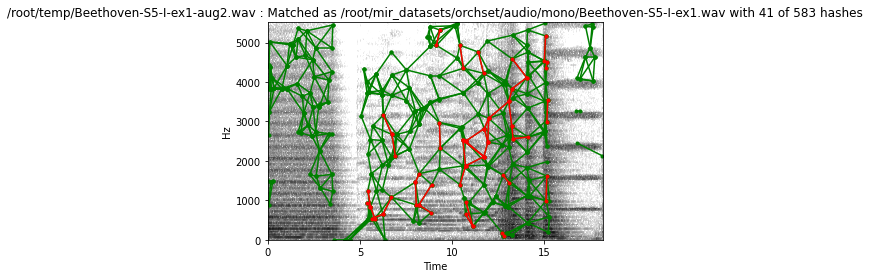

In [15]:
import audfprint_analyze
import audfprint_match
import hash_table
from audfprint_analyze import g2h_analyzer

matcher = audfprint_match.Matcher()
#from audfprint_analyze import Matcher

pat = '/root/mir_datasets/orchset/audio/mono/*wav'
qry = '/root/temp/Beethoven-S5-I-ex1-aug2.wav'

####hash_tab = audfprint_analyze.glob2hashtable(pat) #new database
hash_tab = hash_table.HashTable('fpdbase.pklz') #load old database

g2h_analyzer = audfprint_analyze.Analyzer(density=40.0)

rslts, dur, nhash = matcher.match_file(g2h_analyzer,hash_tab, qry)
t_hop = 0.02322
if len(rslts)>0:
  print("Matched", qry, "(", dur, "s,", nhash, "hashes)",
          "as", hash_tab.names[rslts[0][0]],
          "at", t_hop * float(rslts[0][2]), "with", rslts[0][1],
          "of", rslts[0][3], "hashes")
  %matplotlib inline
  matcher.illustrate_match(g2h_analyzer, hash_tab, qry)
else:
  print("No matches")